## EDA on Expedia Hotel Reservation

In [55]:
import pandas as pd
import numpy as np
import random
import warnings

import matplotlib.pyplot as plt
import seaborn as sns

random_seed = 42

In [29]:
df_test_data = pd.read_csv("data/test.csv")  # , nrows=5000)
df_test_data = df_test_data.sample(n=5000, random_state=random_seed)

# test_data_filename = "data/test.csv"
# n = sum(1 for _ in open(test_data_filename)) - 1
# skip = sorted(random.sample(range(1, n + 1), n - 5000))
# df_test_data = pd.read_csv(test_data_filename, skiprows=skip)

df_test_data.head()

,id,date_time,site_name,posa_continent,user_location_country,user_location_region,user_location_city,orig_destination_distance,user_id,is_mobile,...,srch_ci,srch_co,srch_adults_cnt,srch_children_cnt,srch_rm_cnt,srch_destination_id,srch_destination_type_id,hotel_continent,hotel_country,hotel_market
147422,147422,2015-06-02 15:54:03,2,3,66,318,40556,527.5953,492495,0,...,2015-08-05,2015-08-10,1,0,1,8262,1,2,198,384
132503,132503,2015-10-30 17:37:41,11,3,205,135,36086,65.2535,440663,1,...,2015-11-20,2015-11-22,2,0,1,11629,1,2,198,370
1654062,1654062,2015-01-08 22:40:04,28,1,68,480,24632,NaN,693941,0,...,2015-02-19,2015-02-21,1,0,1,8240,1,6,79,16
998691,998691,2015-12-11 23:05:44,2,3,66,174,18354,2412.4560,925663,0,...,2015-12-18,2015-12-25,2,2,1,8268,1,2,50,682
2036410,2036410,2015-09-01 11:23:35,2,3,66,311,47625,246.5058,767157,0,...,2015-11-24,2015-11-25,2,0,1,26232,6,2,198,384


In [30]:
df_test_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5000 entries, 147422 to 941397
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   id                         5000 non-null   int64  
 1   date_time                  5000 non-null   object 
 2   site_name                  5000 non-null   int64  
 3   posa_continent             5000 non-null   int64  
 4   user_location_country      5000 non-null   int64  
 5   user_location_region       5000 non-null   int64  
 6   user_location_city         5000 non-null   int64  
 7   orig_destination_distance  3331 non-null   float64
 8   user_id                    5000 non-null   int64  
 9   is_mobile                  5000 non-null   int64  
 10  is_package                 5000 non-null   int64  
 11  channel                    5000 non-null   int64  
 12  srch_ci                    5000 non-null   object 
 13  srch_co                    5000 non-null   obj

In [31]:
df_train_data = pd.read_csv("data/train.csv")  # , nrows=20000)
df_train_data = df_train_data.sample(n=20000, random_state=random_seed)

# train_data_filename = "data/train.csv"
# n = sum(1 for _ in open(train_data_filename)) - 1
# skip = sorted(random.sample(range(1, n + 1), n - 20000))
# df_train_data = pd.read_csv(train_data_filename, skiprows=skip)

df_train_data.head()

,date_time,site_name,posa_continent,user_location_country,user_location_region,user_location_city,orig_destination_distance,user_id,is_mobile,is_package,...,srch_children_cnt,srch_rm_cnt,srch_destination_id,srch_destination_type_id,is_booking,cnt,hotel_continent,hotel_country,hotel_market,hotel_cluster
7319399,2014-11-02 12:39:22,2,3,66,220,54870,636.4815,1079676,1,0,...,0,1,5405,6,0,1,4,8,126,66
17258485,2014-08-20 19:13:46,2,3,117,373,16218,NaN,145975,0,0,...,3,2,11917,1,0,1,0,140,59,92
19446179,2014-10-13 12:40:44,23,1,1,457,6693,656.0343,1067677,0,0,...,0,1,8253,1,0,1,6,70,19,51
34114039,2014-04-10 18:17:35,2,3,66,258,4687,5581.4867,179461,1,0,...,0,1,792,1,0,1,6,208,1480,67
20664299,2014-10-23 12:56:53,2,3,66,348,43040,NaN,971368,0,0,...,0,1,12014,1,0,2,2,50,644,68


In [32]:
df_train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20000 entries, 7319399 to 17609598
Data columns (total 24 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   date_time                  20000 non-null  object 
 1   site_name                  20000 non-null  int64  
 2   posa_continent             20000 non-null  int64  
 3   user_location_country      20000 non-null  int64  
 4   user_location_region       20000 non-null  int64  
 5   user_location_city         20000 non-null  int64  
 6   orig_destination_distance  12749 non-null  float64
 7   user_id                    20000 non-null  int64  
 8   is_mobile                  20000 non-null  int64  
 9   is_package                 20000 non-null  int64  
 10  channel                    20000 non-null  int64  
 11  srch_ci                    19977 non-null  object 
 12  srch_co                    19977 non-null  object 
 13  srch_adults_cnt            20000 non-null 

In [33]:
df_test_data.columns

Index(['id', 'date_time', 'site_name', 'posa_continent',
       'user_location_country', 'user_location_region', 'user_location_city',
       'orig_destination_distance', 'user_id', 'is_mobile', 'is_package',
       'channel', 'srch_ci', 'srch_co', 'srch_adults_cnt', 'srch_children_cnt',
       'srch_rm_cnt', 'srch_destination_id', 'srch_destination_type_id',
       'hotel_continent', 'hotel_country', 'hotel_market'],
      dtype='object')

In [34]:
df_train_data.columns

Index(['date_time', 'site_name', 'posa_continent', 'user_location_country',
       'user_location_region', 'user_location_city',
       'orig_destination_distance', 'user_id', 'is_mobile', 'is_package',
       'channel', 'srch_ci', 'srch_co', 'srch_adults_cnt', 'srch_children_cnt',
       'srch_rm_cnt', 'srch_destination_id', 'srch_destination_type_id',
       'is_booking', 'cnt', 'hotel_continent', 'hotel_country', 'hotel_market',
       'hotel_cluster'],
      dtype='object')

# Steps

### - Convert the date columns from str to timestamp
### - Drop the following columns:
    - site_name
    - user_location_country
    - user_location_region
    - orig_destination_distance
    - user_id
    - hotel_continent
    - hotel_country

### We can use Sample function from Pandas to get (https://www.w3schools.com/python/pandas/ref_df_sample.asp)

In [35]:
df_train_data["hotel_cluster"].nunique()

100

In [36]:
df_train_data.isna().sum()

date_time                       0
site_name                       0
posa_continent                  0
user_location_country           0
user_location_region            0
user_location_city              0
orig_destination_distance    7251
user_id                         0
is_mobile                       0
is_package                      0
channel                         0
srch_ci                        23
srch_co                        23
srch_adults_cnt                 0
srch_children_cnt               0
srch_rm_cnt                     0
srch_destination_id             0
srch_destination_type_id        0
is_booking                      0
cnt                             0
hotel_continent                 0
hotel_country                   0
hotel_market                    0
hotel_cluster                   0
dtype: int64

In [37]:
df_test_data.isna().sum()

id                              0
date_time                       0
site_name                       0
posa_continent                  0
user_location_country           0
user_location_region            0
user_location_city              0
orig_destination_distance    1669
user_id                         0
is_mobile                       0
is_package                      0
channel                         0
srch_ci                         0
srch_co                         0
srch_adults_cnt                 0
srch_children_cnt               0
srch_rm_cnt                     0
srch_destination_id             0
srch_destination_type_id        0
hotel_continent                 0
hotel_country                   0
hotel_market                    0
dtype: int64

In [38]:
df_train_data.dropna(subset=["srch_ci", "srch_co"], inplace=True)

In [39]:
# Convert date_time to Unix timestamps for train data
df_train_data["date_time"] = pd.to_datetime(df_train_data["date_time"])
df_train_data["date_time"] = df_train_data["date_time"].astype("int64")
df_train_data["date_time"]

7319399     1414931962000000000
17258485    1408562026000000000
19446179    1413204044000000000
34114039    1397153855000000000
20664299    1414069013000000000
                   ...         
19815108    1402508048000000000
31691707    1417100848000000000
6832708     1408130634000000000
1216269     1410796617000000000
17609598    1408693121000000000
Name: date_time, Length: 19977, dtype: int64

In [40]:
# Convert date_time to Unix timestamps for test data
df_test_data["date_time"] = pd.to_datetime(df_test_data["date_time"])
df_test_data["date_time"] = df_test_data["date_time"].astype("int64")
df_test_data["date_time"]

147422     1433260443000000000
132503     1446226661000000000
1654062    1420756804000000000
998691     1449875144000000000
2036410    1441106615000000000
                  ...         
317084     1431194794000000000
285490     1440097003000000000
278573     1434959525000000000
361505     1450863005000000000
941397     1431802875000000000
Name: date_time, Length: 5000, dtype: int64

In [41]:
# Convert srch_ci to Unix timestamps for train data
df_train_data["srch_ci"] = pd.to_datetime(df_train_data["srch_ci"])
df_train_data["srch_ci"] = df_train_data["srch_ci"].astype("int64")
df_train_data["srch_ci"]

7319399     1444521600000000000
17258485    1411776000000000000
19446179    1419984000000000000
34114039    1407715200000000000
20664299    1414368000000000000
                   ...         
19815108    1417046400000000000
31691707    1439251200000000000
6832708     1408924800000000000
1216269     1411171200000000000
17609598    1411084800000000000
Name: srch_ci, Length: 19977, dtype: int64

In [42]:
# Convert srch_ci to Unix timestamps for test data
df_test_data["srch_ci"] = pd.to_datetime(df_test_data["srch_ci"])
df_test_data["srch_ci"] = df_test_data["srch_ci"].astype("int64")
df_test_data["srch_ci"]

147422     1438732800000000000
132503     1447977600000000000
1654062    1424304000000000000
998691     1450396800000000000
2036410    1448323200000000000
                  ...         
317084     1433376000000000000
285490     1440633600000000000
278573     1437264000000000000
361505     1450915200000000000
941397     1436745600000000000
Name: srch_ci, Length: 5000, dtype: int64

In [43]:
# Convert srch_co to Unix timestamps for train data
df_train_data["srch_co"] = pd.to_datetime(df_train_data["srch_co"])
df_train_data["srch_co"] = df_train_data["srch_co"].astype("int64")
df_train_data["srch_co"]

7319399     1444867200000000000
17258485    1412035200000000000
19446179    1420329600000000000
34114039    1407888000000000000
20664299    1414540800000000000
                   ...         
19815108    1417651200000000000
31691707    1440028800000000000
6832708     1409184000000000000
1216269     1411344000000000000
17609598    1411344000000000000
Name: srch_co, Length: 19977, dtype: int64

In [44]:
# Convert srch_co to Unix timestamps for test data
df_test_data["srch_co"] = pd.to_datetime(df_test_data["srch_co"])
df_test_data["srch_co"] = df_test_data["srch_co"].astype("int64")
df_test_data["srch_co"]

147422     1439164800000000000
132503     1448150400000000000
1654062    1424476800000000000
998691     1451001600000000000
2036410    1448409600000000000
                  ...         
317084     1433462400000000000
285490     1440720000000000000
278573     1437350400000000000
361505     1451001600000000000
941397     1437004800000000000
Name: srch_co, Length: 5000, dtype: int64

In [45]:
df_train_data = df_train_data.drop(["orig_destination_distance", "user_id"], axis=1)
df_train_data

,date_time,site_name,posa_continent,user_location_country,user_location_region,user_location_city,is_mobile,is_package,channel,srch_ci,...,srch_children_cnt,srch_rm_cnt,srch_destination_id,srch_destination_type_id,is_booking,cnt,hotel_continent,hotel_country,hotel_market,hotel_cluster
7319399,1414931962000000000,2,3,66,220,54870,1,0,9,1444521600000000000,...,0,1,5405,6,0,1,4,8,126,66
17258485,1408562026000000000,2,3,117,373,16218,0,0,9,1411776000000000000,...,3,2,11917,1,0,1,0,140,59,92
19446179,1413204044000000000,23,1,1,457,6693,0,0,5,1419984000000000000,...,0,1,8253,1,0,1,6,70,19,51
34114039,1397153855000000000,2,3,66,258,4687,1,0,9,1407715200000000000,...,0,1,792,1,0,1,6,208,1480,67
20664299,1414069013000000000,2,3,66,348,43040,0,0,1,1414368000000000000,...,0,1,12014,1,0,2,2,50,644,68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19815108,1402508048000000000,2,3,66,311,52237,0,0,3,1417046400000000000,...,0,1,20043,6,0,1,4,96,201,60
31691707,1417100848000000000,2,3,66,356,22202,0,0,9,1439251200000000000,...,0,1,20114,6,0,1,3,5,1701,99
6832708,1408130634000000000,2,3,66,220,33119,0,0,7,1408924800000000000,...,0,2,8249,1,0,1,2,50,192,42
1216269,1410796617000000000,2,3,156,173,34762,0,0,9,1411171200000000000,...,3,1,1545,3,0,3,4,193,99,73


In [46]:
df_test_data = df_test_data.drop(["orig_destination_distance", "user_id"], axis=1)
df_test_data

,id,date_time,site_name,posa_continent,user_location_country,user_location_region,user_location_city,is_mobile,is_package,channel,srch_ci,srch_co,srch_adults_cnt,srch_children_cnt,srch_rm_cnt,srch_destination_id,srch_destination_type_id,hotel_continent,hotel_country,hotel_market
147422,147422,1433260443000000000,2,3,66,318,40556,0,1,2,1438732800000000000,1439164800000000000,1,0,1,8262,1,2,198,384
132503,132503,1446226661000000000,11,3,205,135,36086,1,0,10,1447977600000000000,1448150400000000000,2,0,1,11629,1,2,198,370
1654062,1654062,1420756804000000000,28,1,68,480,24632,0,1,1,1424304000000000000,1424476800000000000,1,0,1,8240,1,6,79,16
998691,998691,1449875144000000000,2,3,66,174,18354,0,1,10,1450396800000000000,1451001600000000000,2,2,1,8268,1,2,50,682
2036410,2036410,1441106615000000000,2,3,66,311,47625,0,0,10,1448323200000000000,1448409600000000000,2,0,1,26232,6,2,198,384
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317084,317084,1431194794000000000,8,4,77,977,43534,0,0,10,1433376000000000000,1433462400000000000,4,0,2,18787,1,6,105,1869
285490,285490,1440097003000000000,34,3,205,354,41495,0,0,10,1440633600000000000,1440720000000000000,2,2,1,24945,6,2,198,750
278573,278573,1434959525000000000,24,2,3,59,26212,0,0,0,1437264000000000000,1437350400000000000,1,0,1,12732,5,2,50,637
361505,361505,1450863005000000000,2,3,66,318,33796,0,0,0,1450915200000000000,1451001600000000000,3,0,1,4474,3,2,198,960


In [47]:
df_train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19977 entries, 7319399 to 17609598
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   date_time                 19977 non-null  int64
 1   site_name                 19977 non-null  int64
 2   posa_continent            19977 non-null  int64
 3   user_location_country     19977 non-null  int64
 4   user_location_region      19977 non-null  int64
 5   user_location_city        19977 non-null  int64
 6   is_mobile                 19977 non-null  int64
 7   is_package                19977 non-null  int64
 8   channel                   19977 non-null  int64
 9   srch_ci                   19977 non-null  int64
 10  srch_co                   19977 non-null  int64
 11  srch_adults_cnt           19977 non-null  int64
 12  srch_children_cnt         19977 non-null  int64
 13  srch_rm_cnt               19977 non-null  int64
 14  srch_destination_id       19977 no

In [48]:
df_test_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5000 entries, 147422 to 941397
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   id                        5000 non-null   int64
 1   date_time                 5000 non-null   int64
 2   site_name                 5000 non-null   int64
 3   posa_continent            5000 non-null   int64
 4   user_location_country     5000 non-null   int64
 5   user_location_region      5000 non-null   int64
 6   user_location_city        5000 non-null   int64
 7   is_mobile                 5000 non-null   int64
 8   is_package                5000 non-null   int64
 9   channel                   5000 non-null   int64
 10  srch_ci                   5000 non-null   int64
 11  srch_co                   5000 non-null   int64
 12  srch_adults_cnt           5000 non-null   int64
 13  srch_children_cnt         5000 non-null   int64
 14  srch_rm_cnt               5000 non-nul

In [49]:
df_train_data.describe().T

,count,mean,std,min,25%,50%,75%,max
date_time,19977.0,1.396765e+18,1.752217e+16,1.357541e+18,1.383167e+18,1.401654e+18,1.411247e+18,1.420068e+18
site_name,19977.0,9.711418e+00,1.191272e+01,2.000000e+00,2.000000e+00,2.000000e+00,1.300000e+01,5.300000e+01
posa_continent,19977.0,2.690344e+00,7.443711e-01,0.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00
user_location_country,19977.0,8.641708e+01,5.934332e+01,0.000000e+00,6.600000e+01,6.600000e+01,7.100000e+01,2.390000e+02
user_location_region,19977.0,3.099416e+02,2.088065e+02,0.000000e+00,1.740000e+02,3.140000e+02,3.850000e+02,1.021000e+03
user_location_city,19977.0,2.782955e+04,1.685239e+04,3.000000e+00,1.282500e+04,2.765500e+04,4.265200e+04,5.650700e+04
is_mobile,19977.0,1.364069e-01,3.432287e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
is_package,19977.0,2.400260e-01,4.271097e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
channel,19977.0,5.866547e+00,3.716596e+00,0.000000e+00,2.000000e+00,9.000000e+00,9.000000e+00,1.000000e+01
srch_ci,19977.0,1.401367e+18,1.836708e+16,1.357776e+18,1.388016e+18,1.405642e+18,1.415491e+18,1.452643e+18


In [50]:
df_test_data.describe().T

,count,mean,std,min,25%,50%,75%,max
id,5000.0,1.289719e+06,7.298334e+05,3.930000e+02,6.598735e+05,1.299858e+06,1.947358e+06,2.528037e+06
date_time,5000.0,1.434916e+18,8.671737e+15,1.420678e+18,1.427384e+18,1.434453e+18,1.441911e+18,1.451589e+18
site_name,5000.0,9.489400e+00,1.217997e+01,0.000000e+00,2.000000e+00,2.000000e+00,1.100000e+01,5.300000e+01
posa_continent,5000.0,2.715000e+00,7.599280e-01,0.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00
user_location_country,5000.0,8.476480e+01,5.584962e+01,0.000000e+00,6.600000e+01,6.600000e+01,6.900000e+01,2.390000e+02
user_location_region,5000.0,3.211176e+02,2.130857e+02,0.000000e+00,1.740000e+02,3.180000e+02,4.030000e+02,1.021000e+03
user_location_city,5000.0,2.786888e+04,1.681550e+04,4.000000e+01,1.312825e+04,2.773100e+04,4.232800e+04,5.650700e+04
is_mobile,5000.0,1.410000e-01,3.480564e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
is_package,5000.0,1.090000e-01,3.116704e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
channel,5000.0,6.507200e+00,3.922018e+00,0.000000e+00,2.000000e+00,9.000000e+00,1.000000e+01,1.000000e+01


In [51]:
df_train_data.shape

(19977, 22)

In [52]:
df_test_data.shape

(5000, 20)

In [53]:
display(df_test_data.columns)
display(df_train_data.columns)

Index(['id', 'date_time', 'site_name', 'posa_continent',
       'user_location_country', 'user_location_region', 'user_location_city',
       'is_mobile', 'is_package', 'channel', 'srch_ci', 'srch_co',
       'srch_adults_cnt', 'srch_children_cnt', 'srch_rm_cnt',
       'srch_destination_id', 'srch_destination_type_id', 'hotel_continent',
       'hotel_country', 'hotel_market'],
      dtype='object')

Index(['date_time', 'site_name', 'posa_continent', 'user_location_country',
       'user_location_region', 'user_location_city', 'is_mobile', 'is_package',
       'channel', 'srch_ci', 'srch_co', 'srch_adults_cnt', 'srch_children_cnt',
       'srch_rm_cnt', 'srch_destination_id', 'srch_destination_type_id',
       'is_booking', 'cnt', 'hotel_continent', 'hotel_country', 'hotel_market',
       'hotel_cluster'],
      dtype='object')

In [54]:
diff1 = [item for item in df_test_data.columns if item not in df_train_data.columns]
print(diff1)

diff2 = [item for item in df_train_data.columns if item not in df_test_data.columns]
print(diff2)

['id']
['is_booking', 'cnt', 'hotel_cluster']


# Plot Data
---

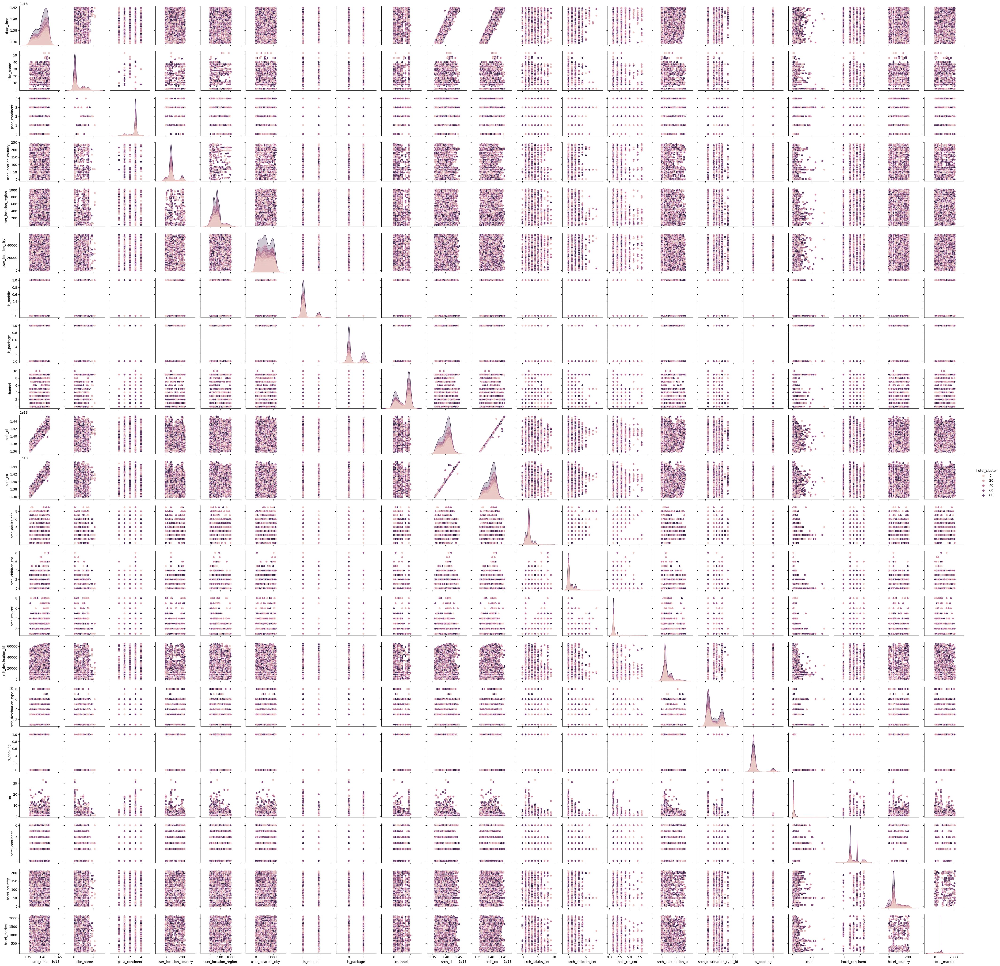

In [ ]:
# sns.pairplot(df_train_data)
# sns.pairplot(df_train_data, hue="hotel_cluster", height=2)

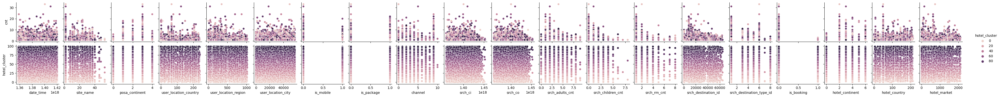

In [ ]:
selected_columns = ["cnt", "hotel_cluster"]

sns.pairplot(
    df_train_data,
    hue="hotel_cluster",
    y_vars=df_train_data[selected_columns],
    x_vars=df_train_data.drop(selected_columns, axis=1),
    height=2,
)

In [57]:
df_train_data.corr()

,date_time,site_name,posa_continent,user_location_country,user_location_region,user_location_city,is_mobile,is_package,channel,srch_ci,...,srch_children_cnt,srch_rm_cnt,srch_destination_id,srch_destination_type_id,is_booking,cnt,hotel_continent,hotel_country,hotel_market,hotel_cluster
date_time,1.000000,-0.017449,-0.008605,-0.012457,-0.013942,-0.009442,0.013141,-0.006698,-0.058380,0.952691,...,-0.054351,0.003417,0.008673,-0.044778,-0.029049,-0.095694,-0.026607,-0.006266,0.015018,0.009163
site_name,-0.017449,1.000000,-0.623993,0.176800,0.128595,-0.013441,-0.026282,0.040750,-0.027299,0.002807,...,-0.035817,0.027711,0.025702,-0.009340,-0.011614,0.014251,0.185752,0.264440,-0.067681,-0.033708
posa_continent,-0.008605,-0.623993,1.000000,0.169286,-0.024550,0.036194,0.029746,-0.082854,0.087570,-0.021299,...,0.031467,-0.045314,-0.002738,0.044218,0.009076,-0.014471,-0.322916,-0.155069,0.049597,0.025099
user_location_country,-0.012457,0.176800,0.169286,1.000000,0.073587,0.136050,0.005959,-0.028826,0.114236,-0.010631,...,0.040996,0.011023,0.008894,0.030843,0.009858,-0.007772,-0.068632,0.095674,0.018773,-0.010625
user_location_region,-0.013942,0.128595,-0.024550,0.073587,1.000000,0.134605,0.005938,0.029233,-0.005451,0.011730,...,0.016685,-0.000090,0.027060,0.009329,0.006189,-0.008096,0.029273,-0.055581,0.048230,-0.002565
user_location_city,-0.009442,-0.013441,0.036194,0.136050,0.134605,1.000000,0.002110,0.009213,0.024061,-0.004767,...,0.021824,0.000388,0.002993,0.004213,0.001850,0.004290,0.009255,-0.010187,0.005576,0.010296
is_mobile,0.013141,-0.026282,0.029746,0.005959,0.005938,0.002110,1.000000,0.058711,-0.029681,0.013778,...,0.023504,-0.037327,-0.015449,-0.025475,-0.025363,0.007428,-0.021723,-0.030217,0.002919,0.008592
is_package,-0.006698,0.040750,-0.082854,-0.028826,0.029233,0.009213,0.058711,1.000000,-0.010757,0.052123,...,-0.031802,-0.046640,-0.155035,-0.222132,-0.077541,0.127694,0.105451,-0.047709,-0.011252,0.032296
channel,-0.058380,-0.027299,0.087570,0.114236,-0.005451,0.024061,-0.029681,-0.010757,1.000000,-0.069626,...,-0.000650,0.002235,0.011586,0.032261,0.023447,-0.015481,-0.022357,0.001638,0.005761,-0.008015
srch_ci,0.952691,0.002807,-0.021299,-0.010631,0.011730,-0.004767,0.013778,0.052123,-0.069626,1.000000,...,-0.037792,0.005745,-0.000465,-0.054979,-0.055999,-0.084355,0.010428,0.003646,0.009728,0.012946


<Axes: >

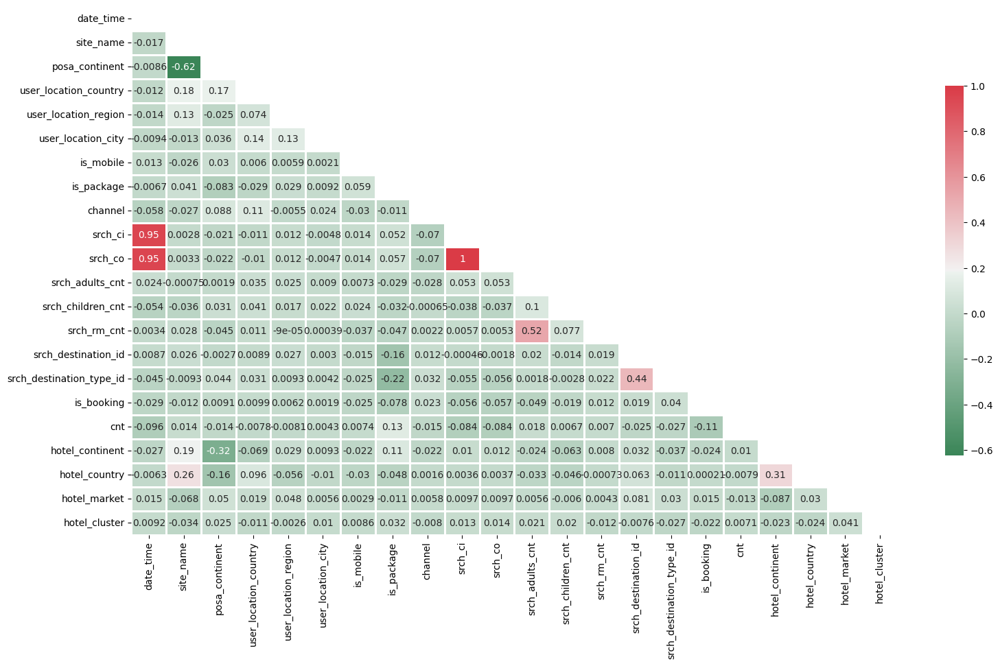

In [ ]:
fig, ax = plt.subplots(figsize=(18, 10))

correlations = df_train_data.corr()

mask = np.zeros_like(correlations)
mask[np.triu_indices_from(mask)] = True

# Generate a custom diverging colormap
cmap = sns.diverging_palette(140, 10, as_cmap=True)

sns.heatmap(
    correlations,
    mask=mask,
    cmap=cmap,
    vmax=1,
    annot=True,
    linewidths=1,
    cbar_kws={"shrink": 0.7},
    ax=ax,
)